# Data frame operations with SparkSQL and SparkR

[**Introduction to Apache Spark with R by J. A. Dianes**](https://github.com/jadianes/spark-r-notebooks)

In this notebook we will introduce more advanced concepts about SparkSQL with R that you can find in the [SparkR documentation](http://spark.apache.org/docs/latest/sparkr.html), applied to the [2013 American Community Survey](http://www.census.gov/programs-surveys/acs/data/summary-file.html) housing data. These concepts are related with data frame manipulation, including data slicing, summary statistics, and aggregations. We will use them in combination with [ggplot2](http://ggplot2.org/) visualisations. We will explain what we do at every step but, if you want to go deeper into `ggplot2` for exploratory data analysis, I did this [Udacity on-line course](https://www.udacity.com/course/data-analysis-with-r--ud651) in the past and I highly recommend it!  

## Creating a SparkSQL context and loading data

In order to explore our data, we first need to load it into a SparkSQL data frame. But first we need to init a SparkSQL context. The first thing we need to do is to set up some environment variables and library paths as follows. Remember to replace the value assigned to `SPARK_HOME` with your Spark home folder.  

In [1]:
# Set Spark home and R libs
Sys.setenv(SPARK_HOME='/home/cluster/spark-1.5.0-bin-hadoop2.6')
.libPaths(c(file.path(Sys.getenv('SPARK_HOME'), 'R', 'lib'), .libPaths()))

Now we can load the `SparkR` library as follows.

In [2]:
library(SparkR)


Attaching package: ‘SparkR’

The following objects are masked from ‘package:stats’:

    filter, na.omit

The following objects are masked from ‘package:base’:

    intersect, rbind, sample, subset, summary, table, transform



And now we can initialise the Spark context as [in the official documentation](http://spark.apache.org/docs/latest/sparkr.html#starting-up-sparkcontext-sqlcontext). In our case we are use a standalone Spark cluster with one master and seven workers. If you are running Spark in local node, use just `master='local'`. Additionally, we require a Spark package from Databricks to read CSV files (more on this in the [previous notebook](https://github.com/jadianes/spark-r-notebooks/blob/master/notebooks/nb1-spark-sql-basics/nb1-spark-sql-basics.ipynb)). 

In [3]:
sc <- sparkR.init(master='spark://169.254.206.2:7077', sparkPackages="com.databricks:spark-csv_2.11:1.2.0")

Launching java with spark-submit command /home/cluster/spark-1.5.0-bin-hadoop2.6/bin/spark-submit  --packages com.databricks:spark-csv_2.11:1.2.0 sparkr-shell /tmp/RtmpfRY7gu/backend_port4c2413c05644 


And finally we can start the SparkSQL context as follows.

In [4]:
sqlContext <- sparkRSQL.init(sc)

Now that we have our SparkSQL context ready, we can use it to load our CSV data into data frames. We have downloaded our [2013 American Community Survey dataset](http://www.census.gov/programs-surveys/acs/data/summary-file.html) files in [notebook 0](https://github.com/jadianes/spark-r-notebooks/tree/master/notebooks/nb0-starting-up/nb0-starting-up.ipynb), so they should be stored locally. Remember to set the right path for your data files in the first line, ours is `/nfs/data/2013-acs/ss13husa.csv`.  

In [5]:
housing_a_file_path <- file.path('', 'nfs','data','2013-acs','ss13husa.csv')
housing_b_file_path <- file.path('', 'nfs','data','2013-acs','ss13husb.csv')

Now let's read into a SparkSQL dataframe. We need to pass four parameters in addition to the `sqlContext`:  

- The file path.  
- `header='true'` since our `csv` files have a header with the column names. 
- Indicate that we want the library to infer the schema.  
- And the source type (the Databricks package in this case). 

And we have two separate files for both, housing and population data. We need to join them.

In [6]:
housing_a_df <- read.df(sqlContext, 
                        housing_a_file_path, 
                        header='true', 
                        source = "com.databricks.spark.csv", 
                        inferSchema='true')

In [7]:
housing_b_df <- read.df(sqlContext, 
                        housing_b_file_path, 
                        header='true', 
                        source = "com.databricks.spark.csv", 
                        inferSchema='true')

In [8]:
housing_df <- rbind(housing_a_df, housing_b_df)

Let's check that we have everything there by counting the files and listing a few of them.

In [9]:
nrow(housing_df)

[1] 1476313

In [10]:
head(housing_df)

,RT,SERIALNO,DIVISION,PUMA,REGION,ST,ADJHSG,ADJINC,WGTP,NP,ellip.h,wgtp71,wgtp72,wgtp73,wgtp74,wgtp75,wgtp76,wgtp77,wgtp78,wgtp79,wgtp80
1,H,84,6,2600,3,1,1000000,1007549,0,1,⋯,0,0,0,0,0,0,0,0,0,0
2,H,154,6,2500,3,1,1000000,1007549,51,4,⋯,86,53,59,84,49,15,15,20,50,16
3,H,156,6,1700,3,1,1000000,1007549,449,1,⋯,161,530,601,579,341,378,387,421,621,486
4,H,160,6,2200,3,1,1000000,1007549,16,3,⋯,31,24,33,7,7,13,18,23,23,5
5,H,231,6,2400,3,1,1000000,1007549,52,1,⋯,21,18,37,49,103,38,49,51,46,47
6,H,286,6,900,3,1,1000000,1007549,76,1,⋯,128,25,68,66,80,26,66,164,88,24


## Giving ggplot2 a try

Before we dive into data selection and aggregations, let's try plotting something using [ggplot2](http://ggplot2.org). We will use this library all the time during our exploratory data analysis, and we better mke sure how to use it with SparkSQL results.

In [11]:
# if it isn't installed, 
# install install.packages("ggplot2") 
# from the R console, specifying a CRAN mirror

library(ggplot2)

What if we directly try to use our SparkSQL `DataFrame` class into a `ggplot`?

In [12]:
c <- ggplot(data=housing_df, aes(x=factor(REGION)))

ERROR: Error: ggplot2 doesn't know how to deal with data of class DataFrame


Obviously it doesn't work that way. The `ggplot` function doesn't know how to deal with that type of distributed data frames (the Spark ones). Instead, we need to collect the data locally as follows.

In [13]:
housing_region_df_local <- collect(select(housing_df,"REGION"))

Let's have a look at what we got.

In [14]:
str(housing_region_df_local)

'data.frame':	1476313 obs. of  1 variable:
 $ REGION: int  3 3 3 3 3 3 3 3 3 3 ...


That is, when we collect results from a SparkSQL `DataFrame` we get a regular R `data.frame`. Very convenient since we can manipulate it as we need to. For example, let's convert that `int` values we have for `REGION` to a factor with the proper names. From our [data dictionary](http://www2.census.gov/programs-surveys/acs/tech_docs/pums/data_dict/PUMSDataDict13.txt) we will get the meaning of the `REGION` variable, as well as the different values it can take.

In [15]:
housing_region_df_local$REGION <- factor(
    x=housing_region_df_local$REGION, 
    levels=c(1,2,3,4,9),
    labels=c('Northeast', 'Midwest','South','West','Puerto Rico')
)

And now we are ready to create the ggplot object as follows.

In [16]:
c <- ggplot(data=housing_region_df_local, aes(x=factor(REGION)))

And now we can give the plot a proper representation (e.g. a [bar plot](http://docs.ggplot2.org/current/geom_bar.html)). 

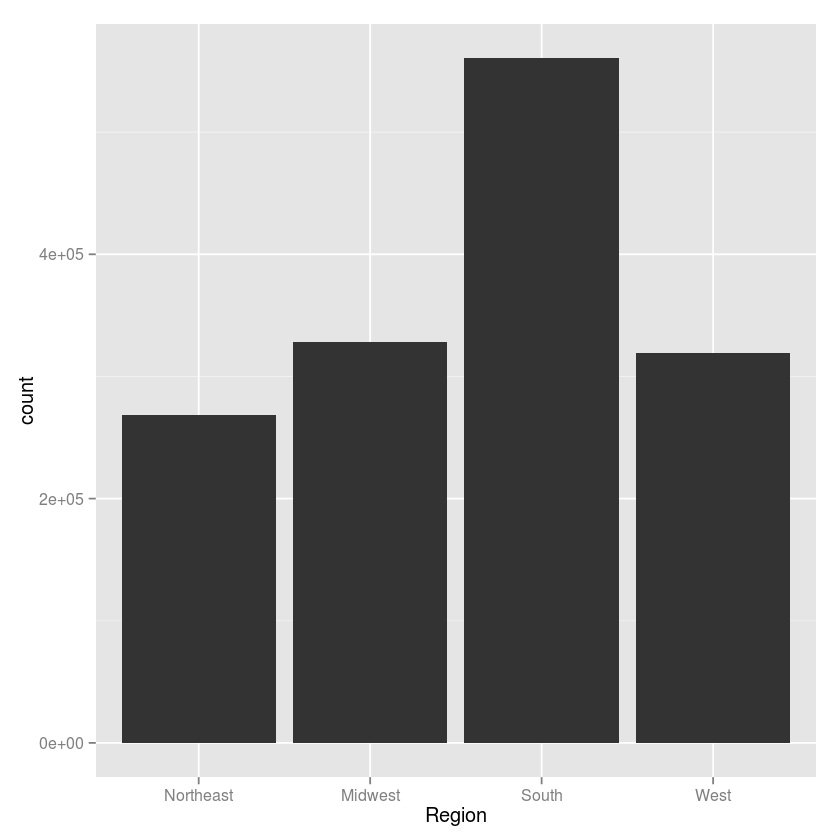

In [17]:
c + geom_bar() + xlab("Region")

We will always follow the same approach. First we make some sort of oepration with the SparkSQL `DataFrame` object (e.g. a selection), then we collect results, and then we prepare the resulting `data.frame` to be represented using ggplot2. But think about the previous. We just represented all the samples for a given column. That is almost a million and a half data points, and we are pushing our local R environment and ggplot2 a lot. In the case of the bar plot we didn't really experience any problems, cause is sort of aggregating data inside. But we will struggle to do scatter plots this way. The preferred kind of visualisations will be those that come from data from aggreations on SparkSQL `DataFrames` as we will see in further sections.

## Data selection

In this section we will demonstrate how to select data from a SparkSQL `DataFrame` object using SparkR. 

### `select` and `selectExpr`

We already made use of the `select` function. but let's have a look at the documentation.

In [18]:
?select

$ {SparkR},R Documentation
x,A DataFrame
col,A list of columns or single Column or name


We have two flavours of `select`. One that gets a list of column names (this is the one we used so far) and another one called `selectExpr` that we pass a string containing a SQL expression. 

Of course we can pass more than a column name.

In [19]:
collect(select(housing_df, "REGION", "VALP"))

,REGION,VALP
1,3,NA
2,3,25000
3,3,80000
4,3,NA
5,3,NA
6,3,18000
7,3,390000
8,3,120000
9,3,NA
10,3,160000


When passing column names we can also use the R notation `data.frame$column.name` so familiar to R users. For example.

In [20]:
collect(select(housing_df, housing_df$VALP))

,VALP
1,NA
2,25000
3,80000
4,NA
5,NA
6,18000
7,390000
8,120000
9,NA
10,160000


How does this notation compares to the name-based one in terms of performance?

In [21]:
system.time(
    collect(select(housing_df, housing_df$VALP))
)

   user  system elapsed 
 30.086   0.032  48.046 

In [22]:
system.time(
    collect(select(housing_df, "VALP"))
)

   user  system elapsed 
 28.766   0.012  46.358 

When using the $ notation, we can even pass expressions as follows.

In [23]:
head(select(housing_df, housing_df$VALP / 100))

,(VALP / 100.0)
1,NA
2,250
3,800
4,NA
5,NA
6,180


So what's the point of `selectExpr` then? Well, we can pass more complex SQL expressions. For example.

In [24]:
head(selectExpr(housing_df, "(VALP / 100) as VALP_by_100"))

,VALP_by_100
1,NA
2,250
3,800
4,NA
5,NA
6,180


### `filter`, `subset`, and `sql`

The previous functions allow us selecting columns. In order to select rows, we will use `filter` and `contains`.

In [25]:
?filter

filter {SparkR},R Documentation
x,A DataFrame to be sorted.
condition,The condition to filter on. This may either be a Column expression or a string containing a SQL statement


With `filter` we filter the rows of a DataFrame according to a given condition that we pass as argument. We can define conditions as SQL conditions using column names or by using the $ notation.

For example, and following with our property values column, let's select property values higher than 1000 for the south region.

In [26]:
system.time(
    housing_valp_1000 <- collect(filter(select(housing_df, "REGION", "VALP"), "VALP > 1000"))
)

   user  system elapsed 
 38.043   0.184  56.259 

In [27]:
housing_valp_1000

,REGION,VALP
1,3,25000
2,3,80000
3,3,18000
4,3,390000
5,3,120000
6,3,160000
7,3,40000
8,3,60000
9,3,60000
10,3,250000


Take into account that we can also perform the previous selection and filtering by using SQL queries agains the SparkSQL `DataFrame`. In order to do that we need to register the table as follows.

In [28]:
registerTempTable(housing_df, "housing")

And then we can use SparkR `sql` function using the `sqlContext` as follows.

In [29]:
system.time(
    housing_valp_1000_sql <- collect(sql(sqlContext, "SELECT REGION, VALP FROM housing WHERE VALP >= 1000"))
)

   user  system elapsed 
 38.862   0.008  56.747 

In [30]:
housing_valp_1000_sql

,REGION,VALP
1,3,25000
2,3,80000
3,3,18000
4,3,390000
5,3,120000
6,3,160000
7,3,40000
8,3,60000
9,3,60000
10,3,250000


This last method might result more clear and flexible when we need to perform complex queries with multiple conditions. Using `filter` and `select` combinations might get verbose versus the clarity of the SQL lingua franca.

But there is another way of subsetting dataframes in a functional way. A way that is very familiar to R users. It is by using the function `subset`. Just have a look at the help page.

In [31]:
?subset

[[ {SparkR},R Documentation
x,A DataFrame
subset,A logical expression to filter on rows
select,expression for the single Column or a list of columns to select from the DataFrame


And we use it as follows.

In [32]:
system.time(
    housing_valp_1000_subset <- collect(subset(housing_df, housing_df$VALP>1000, c("REGION","VALP")))
)

   user  system elapsed 
 39.751   0.020  57.425 

In [33]:
housing_valp_1000_subset

,REGION,VALP
1,3,25000
2,3,80000
3,3,18000
4,3,390000
5,3,120000
6,3,160000
7,3,40000
8,3,60000
9,3,60000
10,3,250000


Even more, we can use the `[]` notation we use with R `data.frame` objects with SparkSQL `DataFrames` thanks to SparkR. For example.  

In [34]:
system.time(
    housing_valp_1000_bracket <- collect(housing_df[housing_df$VALP>1000, c("REGION","VALP")])
)

   user  system elapsed 
 39.090   0.013  56.381 

In [35]:
housing_valp_1000_bracket

,REGION,VALP
1,3,25000
2,3,80000
3,3,18000
4,3,390000
5,3,120000
6,3,160000
7,3,40000
8,3,60000
9,3,60000
10,3,250000


That is, we have up to four different ways of subseting a data frame with SparkR. We can plot any of the previous resulting data frames with a ggplot2 chart as we did before.

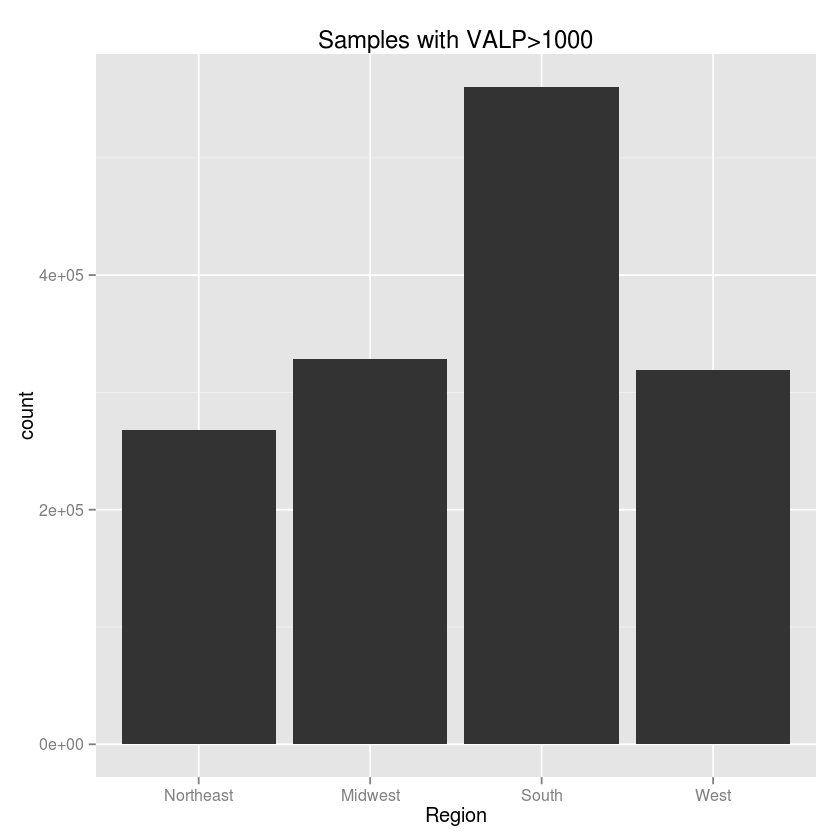

In [36]:
housing_valp_1000_bracket$REGION <- factor(
    x=housing_valp_1000_bracket$REGION, 
    levels=c(1,2,3,4,9),
    labels=c('Northeast', 'Midwest','South','West','Puerto Rico')
)
c <- ggplot(data=housing_region_df_local, aes(x=factor(REGION)))
c + geom_bar() + ggtitle("Samples with VALP>1000") + xlab("Region")

Finally, a function that is useful, specially when imputing missing values in data frames is [`isNaN`](https://spark.apache.org/docs/latest/api/R/isNaN.html) that can be applied to columns as we do with regular R data frames.

## Data aggregation and sorting

In the previous notebook we already had a look at `summary`/`describe` that we can pass column names and get summary statistics that way. If we want instead to be specific about the statistic we want, SparkR also defines the following aggregation functions that we can apply to `DataFrame` objects columns:  

- [`avg`](https://spark.apache.org/docs/latest/api/R/avg.html)    
- [`min`](https://spark.apache.org/docs/latest/api/R/min.html)    
- [`max`](https://spark.apache.org/docs/latest/api/R/max.html)   
- [`sum`](https://spark.apache.org/docs/latest/api/R/sum.html)  
- [`countDistinct`](https://spark.apache.org/docs/latest/api/R/countDistinct.html)  
- [`sumDistinct`](https://spark.apache.org/docs/latest/api/R/sumDistinct.html)  

We use them passing columns with the $ notation, and they return columns, so they need to be part of a `select` call for a `DataFrame`. For example.  

In [37]:
collect(select(housing_df, avg(housing_df$VALP)))

,avg(VALP)
1,247682.8


### `groupBy` and `summarize`/`agg`

A basic operation when doing data aggregations on data frames is `groupBy`. Basically it groups the `DataFrame` we pass using the specified columns, so we can run aggregation on them. We use it in combination with `summarize`/`agg` in order to apply aggregation functions. For example, using the previous `avg` example, let's averagle property values by region as follows.

In [38]:
housing_avg_valp <- collect(agg(
    groupBy(housing_df, "REGION"), 
    NUM_PROPERTIES=n(housing_df$REGION),
    AVG_VALP = avg(housing_df$VALP), 
    MAX_VALUE=max(housing_df$VALP),
    MIN_VALUE=min(housing_df$VALP)
))
housing_avg_valp$REGION <- factor(
    housing_avg_valp$REGION, 
    levels=c(1,2,3,4,9), 
    labels=c('Northeast', 'Midwest','South','West','Puerto Rico')
)
housing_avg_valp

,REGION,NUM_PROPERTIES,AVG_VALP,MAX_VALUE,MIN_VALUE
1,Northeast,268285,314078.1,4775000,100
2,Midwest,328148,168305.3,2381000,100
3,South,560520,204236.9,3934000,100
4,West,319360,365559.3,4727000,110


We can add as many summary/aggregation columns as functions we want to calculate. There is also the posibility of adding several levels of grouping. For example, let's add the number of bedrooms (`BDSP` in our [dictionary](http://www2.census.gov/programs-surveys/acs/tech_docs/pums/data_dict/PUMSDataDict13.txt)) as follows.

In [39]:
housing_avg_valp <- collect(agg(
    groupBy(housing_df, "REGION", "BDSP"), 
    NUM_PROPERTIES=n(housing_df$REGION),
    AVG_VALP = avg(housing_df$VALP), 
    MAX_VALUE=max(housing_df$VALP),
    MIN_VALUE=min(housing_df$VALP)
))
housing_avg_valp$REGION <- factor(
    housing_avg_valp$REGION, 
    levels=c(1,2,3,4,9), 
    labels=c('Northeast', 'Midwest','South','West','Puerto Rico')
)
housing_avg_valp

,REGION,BDSP,NUM_PROPERTIES,AVG_VALP,MAX_VALUE,MIN_VALUE
1,West,NA,30339,NA,NA,NA
2,West,0,7750,226487.3,4727000,120
3,West,1,32620,212315,4727000,110
4,West,2,74334,258654.5,4727000,110
5,West,3,106532,325764.1,4727000,110
6,West,4,51785,459180.8,4727000,110
7,West,5,12533,607017.6,4727000,120
8,West,6,929,391539.8,2198000,170
9,West,7,555,518111.6,3972000,160
10,West,8,87,478757.2,2221000,230


### `arrange`

And finally, we can arrange a `DataFrame`.

In [40]:
head(arrange(select(housing_df, "REGION", "VALP"), desc(housing_df$VALP)))

,REGION,VALP
1,1,4775000
2,1,4775000
3,1,4775000
4,1,4775000
5,1,4775000
6,1,4775000


Or our aggregations.

In [41]:
housing_avg_agg <- agg(
        groupBy(housing_df, "REGION", "BDSP"), 
        NUM_PROPERTIES=n(housing_df$REGION),
        AVG_VALP = avg(housing_df$VALP), 
        MAX_VALUE=max(housing_df$VALP),
        MIN_VALUE=min(housing_df$VALP)
    )
housing_avg_sorted <- head(arrange(housing_avg_agg, desc(housing_avg_agg$AVG_VALP)))

housing_avg_sorted$REGION <- factor(
    housing_avg_sorted$REGION, 
    levels=c(1,2,3,4,9), 
    labels=c('Northeast', 'Midwest','South','West','Puerto Rico')
)
housing_avg_sorted

,REGION,BDSP,NUM_PROPERTIES,AVG_VALP,MAX_VALUE,MIN_VALUE
1,South,14,19,1996615,3934000,320000
2,Northeast,7,273,1305308,4532000,280
3,West,10,1486,975835.3,4727000,250
4,Northeast,8,2228,864495.4,4775000,200
5,South,8,652,681768.1,2738000,250
6,West,19,36,671500,1100000,65000


And that's it. In the next notebook we will dig deeper into property values using these operations and ggplot2 charts.